# Tabula Sapien Data Analysis

"The Tabula Sapiens: A multiple-organ, single-cell transcriptomic atlas of humans" - Science 2022

https://www.science.org/doi/10.1126/science.abl4896

Goal: 

1 - Show the cumulative sum of all 255 genes categorized by cell type

2 - every gene has a normalzied dispersion, for the 4 datasets, where do the 255 genes fall, bar plot with mean and location of all gene sets

3 - for all 4 datasets, what is the enrichment of the 255 genes on the ranked list of variable genes

Process:
Download the datasets into the cluster, remove all of the superfulous data, subset to only the genes of interest, round the normalized value counts. Only need the counts, the "cell_type" obs, the "feature_name". Save as h5ad and export onto local.


In [1]:
import scanpy as sc
import pandas as pd
import numpy as np 
import gseapy as gp
from gseapy import gseaplot
import matplotlib.pyplot as plt
import seaborn as sns
import anndata
from matplotlib import colors
from adjustText import adjust_text

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: 

In [2]:
print(gp.__version__)

1.1.4


# code used to clean the tabula sapien data and save - ran on computing cluster

python script "Tabula_Sapien_255gene_analysis.py"

# Read in the cleaned Tabula Sapien data and generate graphs

had to process the data on the cluster due to size constraints 

There are four different datasets split into - Immune, Epithelial, Stromal, Endothelial

noramlized matrix X of just the 255 genes= 'Immune_tabula_sapien_255.csv'

observational features of all cells = 'Immune_OBS_tabula_sapien_full.csv'

variable features of all cells = 'Immune_VAR_tabula_sapien_full.csv'


In [5]:
#read in the 255 protein coding genes targeted with scCLEAN
NVG = pd.read_csv('Tabula_Sapiens_255_analysis/NVG_scCLEAN.csv', header=None)
NVG = list(NVG[0])

MT = pd.read_csv('Tabula_Sapiens_255_analysis/MT_scCLEAN.csv', header=None)
MT = list(MT[0])

Ribo = pd.read_csv('Tabula_Sapiens_255_analysis/Ribo_scCLEAN.csv', header=None)
Ribo = list(Ribo[0])

scclean_genes = NVG+MT+Ribo

In [16]:
#here is the variance for all genes from Tabula Sapiens 161 cell types
var_df = pd.read_csv('Tabula_Sapiens_255_analysis/VAR_tabula_sapien_full.csv')
var_df = var_df.set_index('feature_name')
var_df

,dispersions_norm,means,dispersions
feature_name,,,
DDX11L1,-0.573947,6.398244e-05,0.835044
WASH7P,0.533204,2.274395e-03,2.442280
MIR6859-1,-0.256874,6.175251e-05,1.295335
MIR1302-2HG,0.680668,1.372886e-04,2.656352
MIR1302-2,0.000000,1.000000e-12,NaN
...,...,...,...
MT-ND6,0.154140,9.634841e-01,2.466404
MT-TE,-0.044396,1.600667e-01,1.603787
MT-CYB,-0.499747,4.367693e+00,4.765751


In [17]:
#genes for the enrichment plot
scclean_genes = NVG+MT+Ribo
not_found = ['ATP5MPL', 'H2AFZ', 'H3F3A', 'H3F3B', 'SLC25A6']
scclean_rev = [name for name in scclean_genes if name not in not_found]

#make the custom gene set
gene_sets={'Variability across 161 Cell Types (Tabula Sapien)':scclean_rev}

In [18]:
#make the list of all ranked genes
rank = pd.DataFrame(var_df['dispersions_norm'])
rank = rank.sort_values(by='dispersions_norm', ascending=False)

#run prerank, 1,000 permutations
pre_res = gp.prerank(rnk=rank,
                     gene_sets=gene_sets, 
                     threads=4,
                     min_size=5,
                     max_size=10000,
                     permutation_num=1000, 
                     outdir=None,  
                     seed=6, 
                     verbose=True, # see what's going on behind the scenes
                    )

2024-12-16 20:28:39,617 [WARNING] Duplicated values found in preranked stats: 2.62% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-12-16 20:28:39,621 [INFO] Parsing data files for GSEA.............................
2024-12-16 20:28:39,644 [INFO] 0000 gene_sets have been filtered out when max_size=10000 and min_size=5
2024-12-16 20:28:39,647 [INFO] 0001 gene_sets used for further statistical testing.....
2024-12-16 20:28:39,648 [INFO] Start to run GSEA...Might take a while..................
2024-12-16 20:28:45,934 [INFO] Congratulations. GSEApy runs successfully................



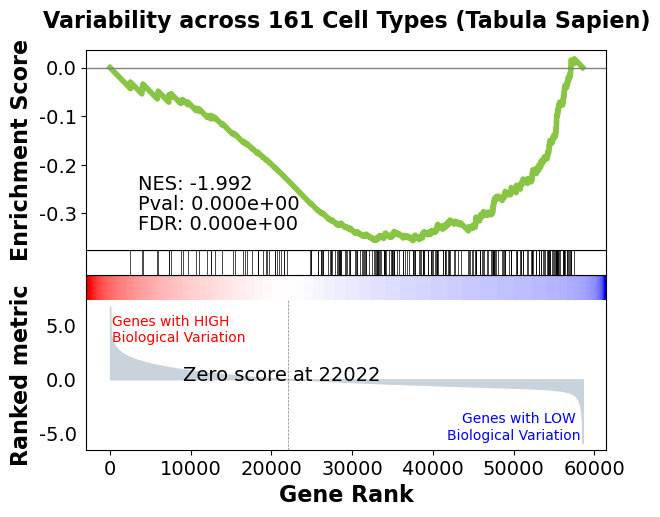

In [19]:
#generate the enrichment plot
terms = pre_res.res2d.Term
i = 0
# to save your figure, make sure that ofname is not None, ofname: output file name
plt.rcParams['axes.grid'] = False
plt.rcParams['axes.titlepad'] = 100 

fig = gseaplot(rank_metric=pre_res.ranking, 
         term=terms[i], 
         **pre_res.results[terms[i]],
        pheno_pos='Genes with HIGH \nBiological Variation', 
        pheno_neg='Genes with LOW \nBiological Variation',
        cmap="seismic",
        figsize=(6.5,5),
        ofname='Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Enrichment.png')

fig = gseaplot(rank_metric=pre_res.ranking, 
         term=terms[i], 
         **pre_res.results[terms[i]],
        pheno_pos='Genes with HIGH \nBiological Variation', 
        pheno_neg='Genes with LOW \nBiological Variation',
        cmap="seismic",
        figsize=(6.5,5))

#positive NES indicates enriched at the top of the list 
#negative NES indicates enriched at the bottom of the list

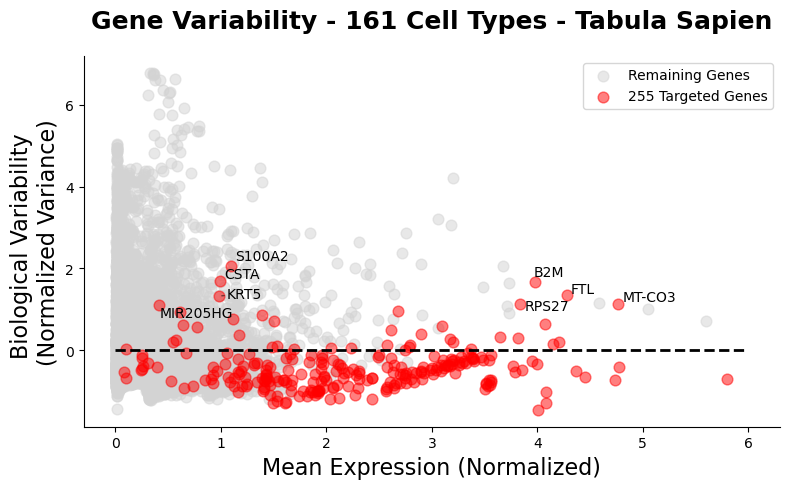

In [20]:
#Plot the mean and the normalized dispersion of the genes targeted 
var_df = var_df[var_df['means']>0.01]
var255 = var_df[var_df.index.isin(scclean_rev)]
var_else = var_df[~var_df.index.isin(scclean_rev)]

fig, ax = plt.subplots(figsize=(8,5), frameon=False)
plt.scatter(var_else.means, var_else.dispersions_norm, s=60, c='lightgrey', label='Remaining Genes', alpha=0.5) 
plt.scatter(var255.means, var255.dispersions_norm, s=60, c='r', label='255 Targeted Genes', alpha=0.5)
plt.legend()

right_side = ax.spines["right"]
right_side.set_visible(False)
top = ax.spines["top"]
top.set_visible(False)

#set a threshold to annotate 
var_thresh = var255[var255['dispersions_norm']>1]
labels = [var_thresh.index[i] for i in range(var_thresh.shape[0])]
texts = []
var_array = np.array(var_thresh[['means', 'dispersions_norm']])
for x, y, text in zip(var_array[:, 0], var_array[:, 1], labels):
    texts.append(ax.text(x, y, text))
adjust_text(texts, force_text=0.05, arrowprops=dict(arrowstyle="-",
                                                    color='black', alpha=0.5)) 

ax.hlines(y=0, xmin=0, xmax=6, colors='black', linestyles='--', lw=2)
plt.title('Gene Variability - 161 Cell Types - Tabula Sapien', size=18, pad=20, fontweight="bold") 
plt.xlabel('Mean Expression (Normalized)', size=16) 
plt.ylabel('Biological Variability \n(Normalized Variance)', size=16) 
plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Scatter.png')
plt.show()

/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_17449/1724759624.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  var_df['Condition'] = ['Targeted' if x in scclean_genes else 'Non-Targeted' for x in var_df.index]
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_17449/1724759624.py:10: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  prop = groups.groupby(level=0).apply(lambda x: x

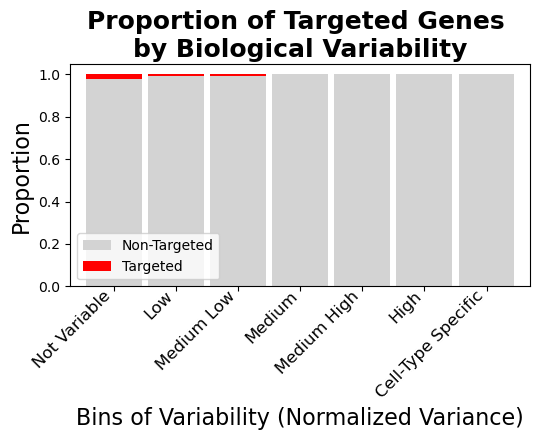

In [25]:
#plot the proportion of genes that fall into each category 
# Create eight bins for column 'Y'
bins = pd.cut(var_df['dispersions_norm'], bins=7)

# Group the DataFrame by the bins and column 'Condition' and calculate the count of rows for each group
var_df['Condition'] = ['Targeted' if x in scclean_genes else 'Non-Targeted' for x in var_df.index]
groups = var_df.groupby([bins, 'Condition']).size()

# Calculate the proportion of rows that are 'Standard' or 'Targeted' within each bin
prop = groups.groupby(level=0).apply(lambda x: x / float(x.sum()))

# Plot a bar graph with eight bars representing the eight bins of column 'Y'
ax = prop.unstack().plot(kind='bar', stacked=True, color={'Non-Targeted':'lightgrey', 
                                                    'Targeted': 'red'}, linewidth=0, width=0.9, 
                         figsize=(5.5,4.5))
ax.set_xticklabels(['Not Variable','Low','Medium Low','Medium','Medium High','High', 'Cell-Type Specific'], 
                   size=12, rotation=45, horizontalalignment='right')
ax.tick_params(axis='x', which='major', pad=-2)

# Set the title and axis labels
plt.title('Proportion of Targeted Genes \nby Biological Variability', fontweight="bold", size=18, pad=5)
plt.xlabel('Bins of Variability (Normalized Variance)', size=16)
plt.ylabel('Proportion', size=16)
plt.legend(loc='lower left')
plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Bins_Variability.png', dpi=200)
plt.show()

/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_17449/2263847592.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  var_df['Condition'] = ['Targeted' if x in scclean_genes else 'Non-Targeted' for x in var_df.index]
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_17449/2263847592.py:10: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  prop = groups.groupby(level=0).apply(lambda x: x

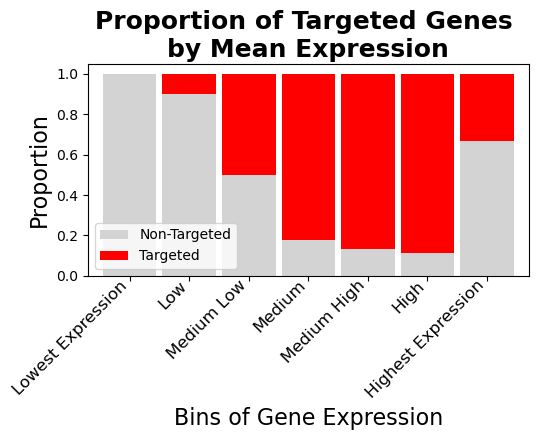

In [26]:
#plot the proportion of genes that fall into each category 
# Create eight bins for column 'Y'
bins = pd.cut(var_df['means'], bins=7)

# Group the DataFrame by the bins and column 'Condition' and calculate the count of rows for each group
var_df['Condition'] = ['Targeted' if x in scclean_genes else 'Non-Targeted' for x in var_df.index]
groups = var_df.groupby([bins, 'Condition']).size()

# Calculate the proportion of rows that are 'Standard' or 'Targeted' within each bin
prop = groups.groupby(level=0).apply(lambda x: x / float(x.sum()))

# Plot a bar graph with eight bars representing the eight bins of column 'Y'
ax = prop.unstack().plot(kind='bar', stacked=True, color={'Non-Targeted':'lightgrey', 
                                                    'Targeted': 'red'}, linewidth=0, width=0.9, 
                         figsize=(5.5,4.5))
ax.set_xticklabels(['Lowest Expression','Low','Medium Low','Medium','Medium High','High', 'Highest Expression'], 
                   size=12, rotation=45, horizontalalignment='right')
ax.tick_params(axis='x', which='major', pad=-2)

# Set the title and axis labels
plt.title('Proportion of Targeted Genes \nby Mean Expression', fontweight="bold", size=18, pad=5)
plt.xlabel('Bins of Gene Expression', size=16)
plt.ylabel('Proportion', size=16)
plt.legend(loc='lower left')
plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Bins_Mean_Expression.png', dpi=200)
plt.show()

Now focus on the 4 main cell types from Tabula Sapiens 
-
Show the variability across all cell types 

this will inform which cell types scCLEAN should be applied to 

In [ ]:
#this is the important metadata from the full dataset
obs_df = pd.read_csv('Tabula_Sapiens_255_analysis/Immune_OBS_tabula_sapien_full.csv')
obs_df = obs_df.set_index('cell_id')
var_df = pd.read_csv('Tabula_Sapiens_255_analysis/Immune_VAR_tabula_sapien_full.csv')
var_df = var_df.set_index('feature_name')
#this is the count matrices from only the 255 genes (5 were not found)
adata = anndata.read_csv('Tabula_Sapiens_255_analysis/Immune_tabula_sapien_255.csv')
adata.obs['cell_type'] = obs_df['cell_type']
adata

In [ ]:
#count the number of cells 
print(len(adata.obs['cell_type'].value_counts().index.astype(str)))

/Users/jbezney/opt/anaconda3/envs/pegasus2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


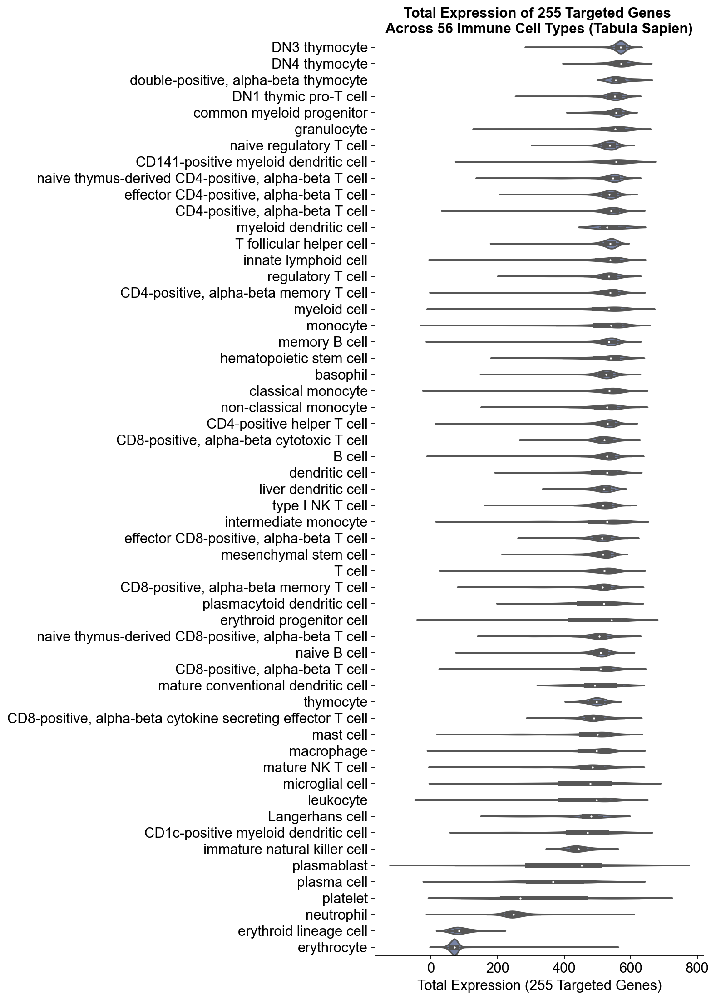

In [15]:
#capture the variability in expression over each cell type 
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []

for cell_type in cell_types:
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix = count_matrix.T
    count_matrix.loc['cell_total'] = count_matrix.sum()
    cell_df = pd.DataFrame()
    cell_df['expression'] = count_matrix.T.cell_total
    cell_df['cell_type'] = cell_type
    specific_cells.extend(list(cell_df['cell_type']))
    total_expression_255.extend(list(cell_df['expression']))

#create dataframe
violin_df = pd.DataFrame()
violin_df['cell_type'] = specific_cells
violin_df['expression'] = total_expression_255
violin_df

#plot
#colors - Endothelial:#A37A74, Stromal:#E49273, Epithelial:#A8D0DB, Immune:#7180AC
fig, axes = plt.subplots(figsize=(10,14))
sns.violinplot('expression', 'cell_type', data=violin_df, ax = axes, width=1,
              inner='box', color='#7180AC', order=list(cell_exp.cell_types))
axes.set_title('Total Expression of 255 Targeted Genes \nAcross 56 Immune Cell Types (Tabula Sapien)',
            fontweight="bold")
axes.set_xlabel('Total Expression (255 Targeted Genes)')
axes.set_ylabel('')

right_side = axes.spines["right"]
right_side.set_visible(False)
top = axes.spines["top"]
top.set_visible(False)

plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Immune_violin.png')
plt.show()

In [27]:
#this is the important metadata from the full dataset
obs_df = pd.read_csv('Tabula_Sapiens_255_analysis/Epithelial_OBS_tabula_sapien_full.csv')
obs_df = obs_df.set_index('cell_id')
var_df = pd.read_csv('Tabula_Sapiens_255_analysis/Epithelial_VAR_tabula_sapien_full.csv')
var_df = var_df.set_index('feature_name')
#this is the count matrices from only the 255 genes (5 were not found)
adata = anndata.read_csv('Tabula_Sapiens_255_analysis/Epithelial_tabula_sapien_255.csv')
adata.obs['cell_type'] = obs_df['cell_type']
adata

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)


AnnData object with n_obs × n_vars = 104148 × 250
    obs: 'cell_type'

In [32]:
#count the number of cells 
print(len(adata.obs['cell_type'].value_counts().index.astype(str)))

62


In [33]:
#for each cell type, the median expression of each of the 255 genes was summed
#keep in mind this is PCR and UMI de-dupped and does not represent raw reads, just a relative estimate
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []
for cell_type in cell_types:
    specific_cells.append(cell_type)
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix.loc['total'] = count_matrix.median()
    count_matrix = count_matrix.T
    total_expression = count_matrix.total.sum()
    total_expression_255.append(total_expression)

cell_exp = pd.DataFrame()
cell_exp['cell_types'] = specific_cells
cell_exp['expression'] = total_expression_255
cell_exp = cell_exp.sort_values('expression', ascending=False)

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


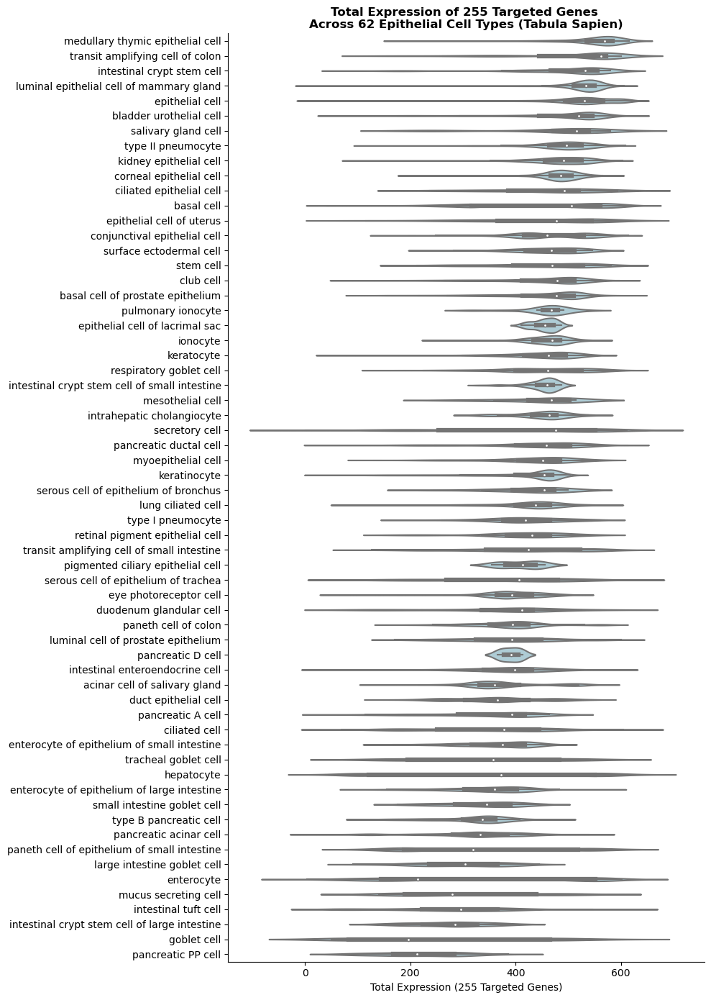

In [35]:
#capture the variability in expression over each cell type 
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []

for cell_type in cell_types:
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix = count_matrix.T
    count_matrix.loc['cell_total'] = count_matrix.sum()
    cell_df = pd.DataFrame()
    cell_df['expression'] = count_matrix.T.cell_total
    cell_df['cell_type'] = cell_type
    specific_cells.extend(list(cell_df['cell_type']))
    total_expression_255.extend(list(cell_df['expression']))

#create dataframe
violin_df = pd.DataFrame()
violin_df['cell_type'] = specific_cells
violin_df['expression'] = total_expression_255

#plot
#colors - Endothelial:#A37A74, Stromal:#E49273, Epithelial:#A8D0DB, Immune:#7180AC
fig, axes = plt.subplots(figsize=(10,14))
sns.violinplot('expression', 'cell_type', data=violin_df, ax = axes, width=1,
              inner='box', color='#A8D0DB',  order=list(cell_exp.cell_types))
axes.set_title('Total Expression of 255 Targeted Genes \nAcross 62 Epithelial Cell Types (Tabula Sapien)',
            fontweight="bold", pad=5)
axes.set_xlabel('Total Expression (255 Targeted Genes)')
axes.set_ylabel('')

right_side = axes.spines["right"]
right_side.set_visible(False)
top = axes.spines["top"]
top.set_visible(False)

plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Epithelial_violin.png')
plt.show()

In [4]:
#this is the important metadata from the full dataset
obs_df = pd.read_csv('Tabula_Sapiens_255_analysis/endothelial_OBS_tabula_sapien_full.csv')
obs_df = obs_df.set_index('cell_id')
var_df = pd.read_csv('Tabula_Sapiens_255_analysis/endothelial_VAR_tabula_sapien_full.csv')
var_df = var_df.set_index('feature_name')
#this is the count matrices from only the 255 genes (5 were not found)
adata = anndata.read_csv('Tabula_Sapiens_255_analysis/endothelial_tabula_sapien_255.csv')
adata.obs['cell_type'] = obs_df['cell_type']
adata

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)


AnnData object with n_obs × n_vars = 31691 × 250
    obs: 'cell_type'

In [5]:
#count the number of cells 
print(len(adata.obs['cell_type'].value_counts().index.astype(str)))

12


In [6]:
#for each cell type, the median expression of each of the 255 genes was summed
#keep in mind this is PCR and UMI de-dupped and does not represent raw reads, just a relative estimate
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []
for cell_type in cell_types:
    specific_cells.append(cell_type)
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix.loc['total'] = count_matrix.median()
    count_matrix = count_matrix.T
    total_expression = count_matrix.total.sum()
    total_expression_255.append(total_expression)

cell_exp = pd.DataFrame()
cell_exp['cell_types'] = specific_cells
cell_exp['expression'] = total_expression_255
cell_exp = cell_exp.sort_values('expression', ascending=False)

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


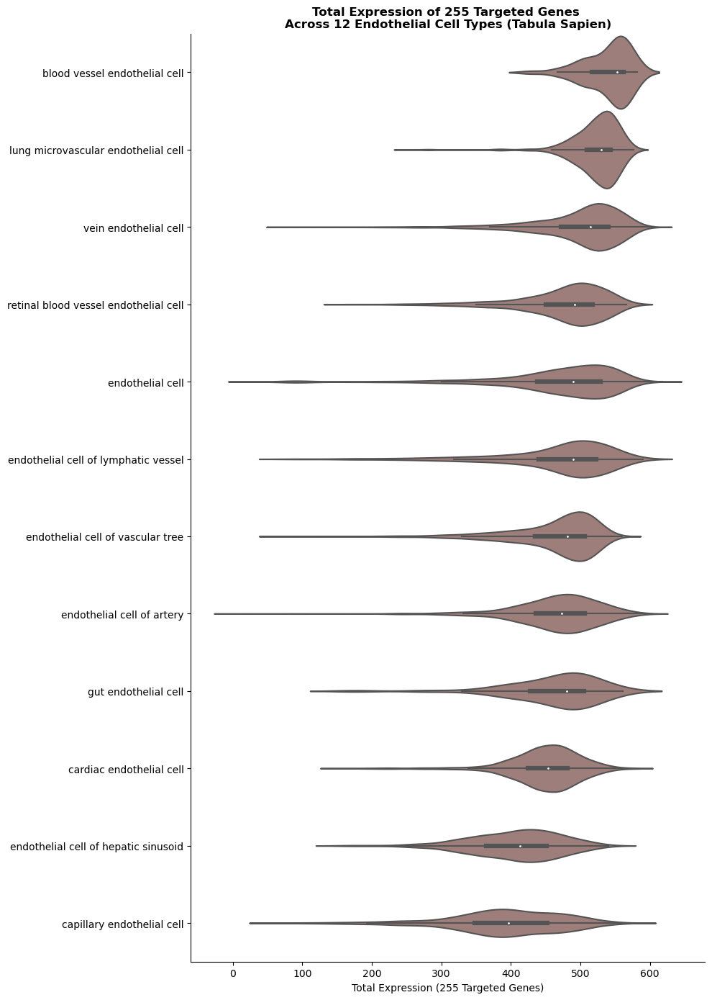

In [8]:
#capture the variability in expression over each cell type 
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []

for cell_type in cell_types:
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix = count_matrix.T
    count_matrix.loc['cell_total'] = count_matrix.sum()
    cell_df = pd.DataFrame()
    cell_df['expression'] = count_matrix.T.cell_total
    cell_df['cell_type'] = cell_type
    specific_cells.extend(list(cell_df['cell_type']))
    total_expression_255.extend(list(cell_df['expression']))

#create dataframe
violin_df = pd.DataFrame()
violin_df['cell_type'] = specific_cells
violin_df['expression'] = total_expression_255

#plot
#colors - Endothelial:#A37A74, Stromal:#E49273, Epithelial:#A8D0DB, Immune:#7180AC
fig, axes = plt.subplots(figsize=(10,14))
sns.violinplot('expression', 'cell_type', data=violin_df, ax = axes, width=1,
              inner='box', color='#A37A74', order=list(cell_exp.cell_types))
axes.set_title('Total Expression of 255 Targeted Genes \nAcross 12 Endothelial Cell Types (Tabula Sapien)',
            fontweight="bold")
axes.set_xlabel('Total Expression (255 Targeted Genes)')
axes.set_ylabel('')

right_side = axes.spines["right"]
right_side.set_visible(False)
top = axes.spines["top"]
top.set_visible(False)

plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Endothelial_violin.png')
plt.show()

In [9]:
#this is the important metadata from the full dataset
obs_df = pd.read_csv('Tabula_Sapiens_255_analysis/stromal_OBS_tabula_sapien_full.csv')
obs_df = obs_df.set_index('cell_id')
var_df = pd.read_csv('Tabula_Sapiens_255_analysis/stromal_VAR_tabula_sapien_full.csv')
var_df = var_df.set_index('feature_name')
#this is the count matrices from only the 255 genes (5 were not found)
adata = anndata.read_csv('Tabula_Sapiens_255_analysis/stromal_tabula_sapien_255.csv')
adata.obs['cell_type'] = obs_df['cell_type']
adata

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)


AnnData object with n_obs × n_vars = 82478 × 250
    obs: 'cell_type'

In [10]:
#count the number of cells 
print(len(adata.obs['cell_type'].value_counts().index.astype(str)))

31


In [12]:
#for each cell type, the median expression of each of the 255 genes was summed
#keep in mind this is PCR and UMI de-dupped and does not represent raw reads, just a relative estimate
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []
for cell_type in cell_types:
    specific_cells.append(cell_type)
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix.loc['total'] = count_matrix.median()
    count_matrix = count_matrix.T
    total_expression = count_matrix.total.sum()
    total_expression_255.append(total_expression)

cell_exp = pd.DataFrame()
cell_exp['cell_types'] = specific_cells
cell_exp['expression'] = total_expression_255
cell_exp = cell_exp.sort_values('expression', ascending=False)

/Users/jbezney/miniforge3/envs/pegasus/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


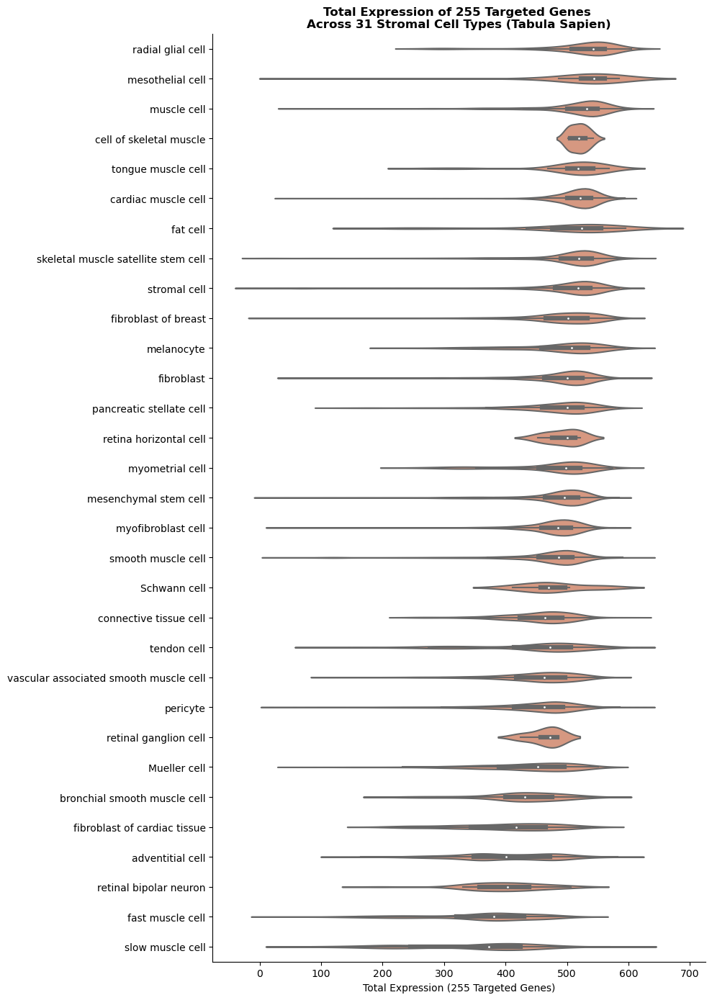

In [14]:
#capture the variability in expression over each cell type 
cell_types = list(adata.obs['cell_type'].value_counts().index.astype(str))
specific_cells = []
total_expression_255 = []

for cell_type in cell_types:
    adata_sub = adata[adata.obs['cell_type']==cell_type]
    count_matrix = pd.DataFrame(adata_sub.X)
    count_matrix = count_matrix.T
    count_matrix.loc['cell_total'] = count_matrix.sum()
    cell_df = pd.DataFrame()
    cell_df['expression'] = count_matrix.T.cell_total
    cell_df['cell_type'] = cell_type
    specific_cells.extend(list(cell_df['cell_type']))
    total_expression_255.extend(list(cell_df['expression']))

#create dataframe
violin_df = pd.DataFrame()
violin_df['cell_type'] = specific_cells
violin_df['expression'] = total_expression_255

#plot
#colors - Endothelial:#A37A74, Stromal:#E49273, Epithelial:#A8D0DB, Immune:#7180AC
fig, axes = plt.subplots(figsize=(10,14))
sns.violinplot('expression', 'cell_type', data=violin_df, ax = axes, width=1,
              inner='box', color='#E49273', order=list(cell_exp.cell_types))
axes.set_title('Total Expression of 255 Targeted Genes \nAcross 31 Stromal Cell Types (Tabula Sapien)',
            fontweight="bold")
axes.set_xlabel('Total Expression (255 Targeted Genes)')
axes.set_ylabel('')

right_side = axes.spines["right"]
right_side.set_visible(False)
top = axes.spines["top"]
top.set_visible(False)

plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Tabula_Sapien_SingleCell_Endothelial_violin.png')
plt.show()

# Tissue specific gene expression - are we hitting any biologically relevant genes?

The human transcriptome across tissues and individuals
https://www.science.org/doi/10.1126/science.aaa0355?url_ver=Z39.88-2003&rfr_id=ori:rid:crossref.org&rfr_dat=cr_pub%20%200pubmed

goal: for each tissue, where do our 255 genes lie in terms of tissue specificity?

the more tissue the specific, the more biologically relevant a gene is

supp. table 5 - We used the noiseqbio function with q > 0.99 (FDR=0.01) and log2 fold
change >= 4 to call tissue preferential gene expression after comparing the samples from
a given tissue to those samples that did not belong to the tissue 

Human_transcriptome_tissue_specificity.xlsx


In [15]:
#read in the data and convert to gene name 
deg = pd.read_csv('Tabula_Sapiens_255_analysis/Human_Transcriptome_Tissue_Specificity.csv')
gene_ids = list(deg['gene_id'])
ens_id = []
for gene in gene_ids:
    first_portion = gene.split('.')[0]
    ens_id.append(first_portion)
deg['ens_id'] = ens_id
deg = deg.set_index('ens_id')
conv = pd.read_csv('Tabula_Sapiens_255_analysis/Gene_name_ensembl_ID_conversion.csv')
conv = conv.set_index('gene_id')
deg['gene'] = conv['feature_name']
deg = deg.set_index('gene')


In [16]:
#create a dataframe of counts for how many important genes are targeted for each tissue
deg_sub = deg[deg.index.isin(scclean_genes)]
tissues = []
hits_per_tissue = []
for tissue in deg.Tissue.unique():
    tiss_df = deg_sub[deg_sub['Tissue']==tissue]
    hits = len(tiss_df)
    tissues.append(tissue)
    hits_per_tissue.append(hits)
    
deg_df = pd.DataFrame()
deg_df['tissue'] = tissues
deg_df['hits'] = hits_per_tissue
deg_df = deg_df.set_index('tissue')


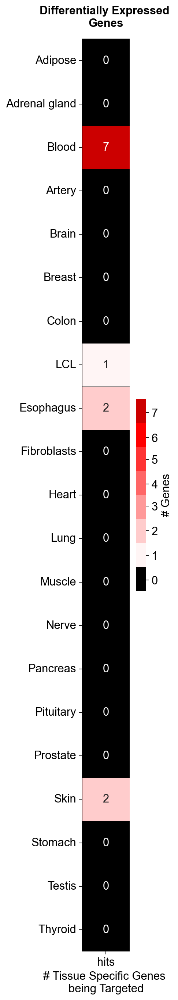

In [26]:
#plot the hits as heatmap
fig, ax = plt.subplots(figsize = (4, 18))
cbar_kws = {'label': '# Genes', 'orientation': 'vertical', 'pad':0.1, 
            'ticks':[0.4, 1.3, 2.2, 3.1, 3.9, 4.8, 5.6, 6.5]}

#cbar_kws = dict(pad=0.01, shrink=0.86, drawedges=True, ticks=range(int(5) + 1))
sns.heatmap(deg_df, linewidths = 0.30, annot = True,linecolor="black",
           cbar_kws=cbar_kws,
           cmap=['black','#FFF5F5','#FFCCCC','#FF9999','#FF6666', '#FF3333', '#FF0000', '#CC0000'])

ax.collections[0].colorbar.set_ticklabels([0,1,2,3,4,5,6,7])

plt.ylabel("") 
plt.title('Differentially Expressed \nGenes',fontsize=14, pad=15, fontweight="bold")
plt.xlabel("# Tissue Specific Genes \nbeing Targeted") 
plt.tight_layout(pad=3.0)
plt.savefig('Tabula_Sapiens_255_analysis/Human_transcriptome_DEGs_Heatmap.png')
plt.show()



Extended Tau - Tissue Specific Genes

https://biodatamining.biomedcentral.com/articles/10.1186/s13040-022-00315-9

https://gitlab.com/busra/modified_tau/-/tree/master/

updated rigorous test for tissue specificity 

goal: are some of the 255 genes included in this tissue specific test?

In [27]:
#import the gene to ensembl ID conversion table
conv = pd.read_csv('Tabula_Sapiens_255_analysis/Gene_name_ensembl_ID_conversion.csv')
conv = conv.set_index('gene_id')

etau = pd.read_csv('Tabula_Sapiens_255_analysis/ExtTau_geneTissuepair5214_GTEX_53_tissues.csv')
etau = etau.set_index('EnsemblGeneID')
etau['gene'] = conv['feature_name']
etau = etau.set_index('gene')


In [28]:
#create a dataframe of counts for how many important genes are targeted for each tissue
#subset that list to just the genes (if any) found within 255 set
etau_sub = etau[etau.index.isin(scclean_genes)]
tissues = []
hits_per_tissue = []
for tissue in etau.tissue.unique():
    tiss_df = etau_sub[etau_sub['tissue']==tissue]
    hits = len(tiss_df)
    tissues.append(tissue)
    hits_per_tissue.append(hits)

etau_df = pd.DataFrame()
etau_df['tissue'] = tissues
etau_df['hits'] = hits_per_tissue
etau_df = etau_df.set_index('tissue')

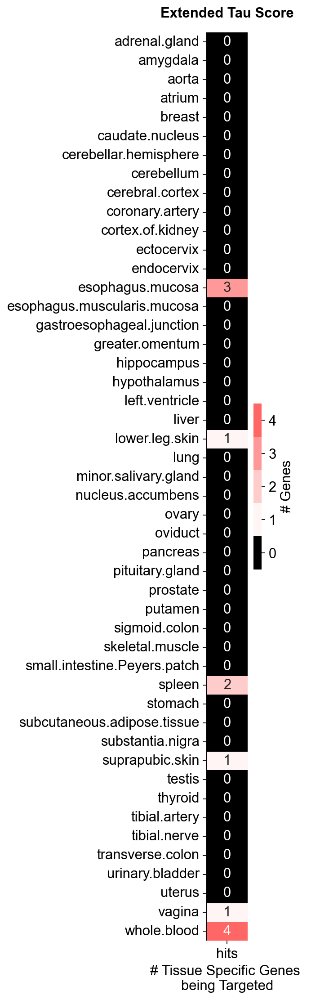

In [42]:
fig, ax = plt.subplots(figsize = (8, 18))
cbar_kws = {'label': '# Genes', 'orientation': 'vertical', 'pad':0.1, 'ticks':[0.4, 1.2, 2, 2.8, 3.6]}

sns.heatmap(etau_df, linewidths = 0.30, annot = True,linecolor="black",
           cbar_kws=cbar_kws,
           cmap=['black','#FFF5F5','#FFCCCC','#FF9999','#FF6666'])

ax.collections[0].colorbar.set_ticklabels([0,1,2,3,4])

plt.ylabel("") 
plt.title('Extended Tau Score',fontsize=14, pad=15, fontweight="bold")
plt.xlabel("# Tissue Specific Genes \nbeing Targeted") 
plt.tight_layout(pad=11)
plt.savefig('Tabula_Sapiens_255_analysis/Extended_Tau_Heatmap.png')
plt.show()

Cell Markers datasets 

what cell types are being hit with genes being targeted?

https://academic.oup.com/nar/article/51/D1/D870/6775381

CellMarker 2.0: an updated database of manually curated cell markers in human/mouse and web tools based on scRNA-seq data

Cell_markers_Human.csv

We are further constraining the dataset by removing genes that are "cell markers" for more than one cell type.

In [146]:
#import the raw data
cell = pd.read_csv('Tabula_Sapiens_255_analysis/Cell_markers_Human.csv')
cell = cell[['cell_name','Symbol']].dropna()
cell = cell.set_index('Symbol')


/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/262412149.py:2: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,11,12,13,14,15,17,18) have mixed types. Specify dtype option on import or set low_memory=False.
  cell = pd.read_csv('Tabula_Sapiens_255_analysis/Cell_markers_Human.csv')


In [147]:
#need to remove the situations where the same gene is marked more than once for the same cell type
cell_sub = cell[cell.index.isin(scclean_genes)]
genes = list(cell_sub.index)
genes_rev = []
cells_rev = []
for gene in genes:
    df = cell_sub[cell_sub.index == gene]
    df = df.drop_duplicates(subset='cell_name', keep="first")
    #if a gene is a cell marker for >100 cells (PTPRC), then it is not a unique cell marker 
    if len(df) == 1:
        genes_rev.extend(list(df.index))
        cells_rev.extend(list(df.cell_name))

single_cells_df = pd.DataFrame()
single_cells_df['genes'] = genes_rev
single_cells_df['cell'] = cells_rev
single_cells_df = single_cells_df.set_index('genes')


In [148]:
#create a dataframe of counts for how many important genes are targeted for each cell type
cell_types = []
hits_per_cell = []
for cell_type in cell.cell_name.unique():
    cell_df = single_cells_df[single_cells_df['cell']==cell_type]
    hits = len(cell_df)
    cell_types.append(cell_type)
    hits_per_cell.append(hits)

cell_df = pd.DataFrame()
cell_df['cell_type'] = cell_types
cell_df['hits'] = hits_per_cell
cell_df = cell_df.set_index('cell_type')


In [149]:
#create a dataframe of counts for how many important genes are targeted for each cell type
cell_types = []
hits_per_cell = []

for cell_type in cell.cell_name.unique():
    cell_df = single_cells_df[single_cells_df['cell']==cell_type]
    hits = len(cell_df)
    cell_types.append(cell_type)
    hits_per_cell.append(hits)

cell_df = pd.DataFrame()
cell_df['cell_type'] = cell_types
cell_df['hits'] = hits_per_cell
cell_df = cell_df.set_index('cell_type')

#report the percent of total cell markers being hit as an additional column 
p_cell = []
p_total = []
#remove genes that are 'cell markers' for more than one cell type
cell['gene'] = cell.index
counts = cell.groupby('gene')['cell_name'].nunique()
mask = cell['gene'].apply(lambda x: counts[x] == 1)
cell = cell[mask]
for x in list(cell_df.index):
    p_cell.append(x)
    nkt = cell[cell['cell_name']==x]
    nkt = list(nkt.index.drop_duplicates())
    p_total.append(len(nkt))

cell_df['Total Markers'] = p_total
cell_df['% of Total'] = (cell_df['hits']/cell_df['Total Markers'])*100
cell_hits_df = cell_df
cell_df = cell_df.drop('Total Markers', axis=1)
cell_df = cell_df.fillna(0)
#shorten one of the cell names
cell_df = cell_df.rename(index={'CD8+ terminally differentiated effector memory re-expressing CD45RA T cell(CD8+ TEMRA)': 'CD8+ TEMRA CD45RA T cell'})
#cell_df = cell_df.sort_values(by='% of Total',ascending=False)

In [150]:
#add the exact marker genes that are being hit for every cell type 
cell_hits_df = cell_hits_df[cell_hits_df['hits']!=0]
cell_hits_df['Gene hits'] = ''
for cell in cell_hits_df.index:
    hit_df = single_cells_df[single_cells_df['cell']==cell]
    cell_genes = list(hit_df.index.values)
    print(cell_genes)
    cell_hits_df.at[cell, 'Gene hits'] = cell_genes
    
cell_hits_df['Gene Hits'] = [','.join(map(str, l)) for l in cell_hits_df['Gene hits']]
cell_hits_df = cell_hits_df.drop('Gene hits', axis=1)
cell_hits_df = cell_hits_df.sort_values(by='% of Total', ascending=False)
cell_hits_df.to_csv('Tabula_Sapiens_255_analysis/Single_cell_Marker_hits_CellMarker2.0.csv')
cell_hits_df

['RAC1']
['GABARAP']
['PTMS']
['RPL36', 'SUMO2', 'RPS6KB2', 'SLC25A6', 'NDUFB2', 'PSMA7', 'RPL19', 'RPS6KB1', 'COX6C', 'EDF1', 'RPL36AL', 'SLC25A3', 'ELOB', 'MZT2B', 'SRP14', 'RPS6KA5', 'ATP5PF', 'HNRNPA2B1', 'ATP5F1D', 'GUK1', 'RPS19BP1', 'UBB', 'CFL1', 'EIF1']
['NME2']
['SNHG5']
['RPS6KC1']


,hits,Total Markers,% of Total,Gene Hits
cell_type,,,,
Exhausted CD8+ T cell,1,17,5.882353,PTMS
Oligodendrocyte,1,29,3.448276,NME2
Regulatory T (Treg) cell,1,34,2.941176,GABARAP
Mitotic fetal germ cell,1,64,1.562500,SNHG5
Ionocyte cell,1,68,1.470588,RPS6KC1
Natural killer T (NKT) cell,24,1674,1.433692,"RPL36,SUMO2,RPS6KB2,SLC25A6,NDUFB2,PSMA7,RPL19..."
Monocyte,1,72,1.388889,RAC1


/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/2575699322.py:30: UserWarning: Glyph 8208 (\N{HYPHEN}) missing from current font.
  plt.tight_layout(pad=10.0)
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/2575699322.py:30: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(pad=10.0)
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/2575699322.py:31: UserWarning: Glyph 8208 (\N{HYPHEN}) missing from current font.
  plt.savefig('Tabula_Sapiens_255_analysis/Single_Cell_Markers_Hits_Part1.png')
/Users/jbezney/opt/anaconda3/envs/pegasus2/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8208 (\N{HYPHEN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


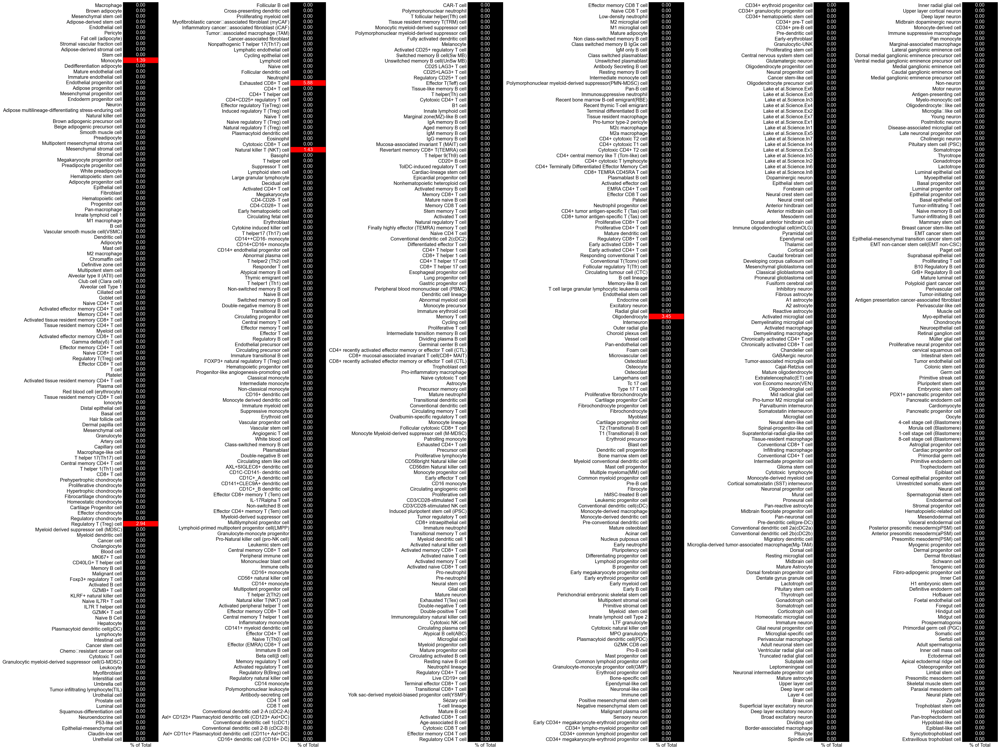

In [151]:
from matplotlib import colors
#just plot the Percent of total to simplify 
percent_total_per_cell = cell_df.drop('hits', axis=1)

# Split the dataframe into part 1
half_df = percent_total_per_cell.head(round(len(percent_total_per_cell)/2))
split_df = np.array_split(half_df, 6)

# create a figure with 6 subplots
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(40, 30), constrained_layout = True)

cmap = colors.ListedColormap(['black', 'red'])
# plot each dataframe as a heatmap in its corresponding subplot
for i, df_part in enumerate(split_df):
    ax = axes[i]
    ax.imshow(df_part, cmap=cmap, vmax=2,
              aspect='auto')
    ax.set_xticks(range(len(df_part.columns)))
    ax.set_yticks(range(len(df_part)))
    ax.set_xticklabels(df_part.columns)
    ax.set_yticklabels(df_part.index)
    ax.tick_params(axis='both', which='both', length=0)
    
    for j in range(df_part.shape[0]):
        for k in range(df_part.shape[1]):
            text = ax.text(k, j, f'{df_part.iloc[j,k]:.2f}',
                               ha="center", va="center", color="w")
    
# add padding between subplots
plt.tight_layout(pad=10.0)
plt.savefig('Tabula_Sapiens_255_analysis/Single_Cell_Markers_Hits_Part1.png')
plt.show()

/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/1070300644.py:26: UserWarning: Glyph 8208 (\N{HYPHEN}) missing from current font.
  plt.tight_layout(pad=10.0)
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/1070300644.py:26: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(pad=10.0)
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_95968/1070300644.py:27: UserWarning: Glyph 8208 (\N{HYPHEN}) missing from current font.
  plt.savefig('Tabula_Sapiens_255_analysis/Single_Cell_Markers_Hits_Part2.png')


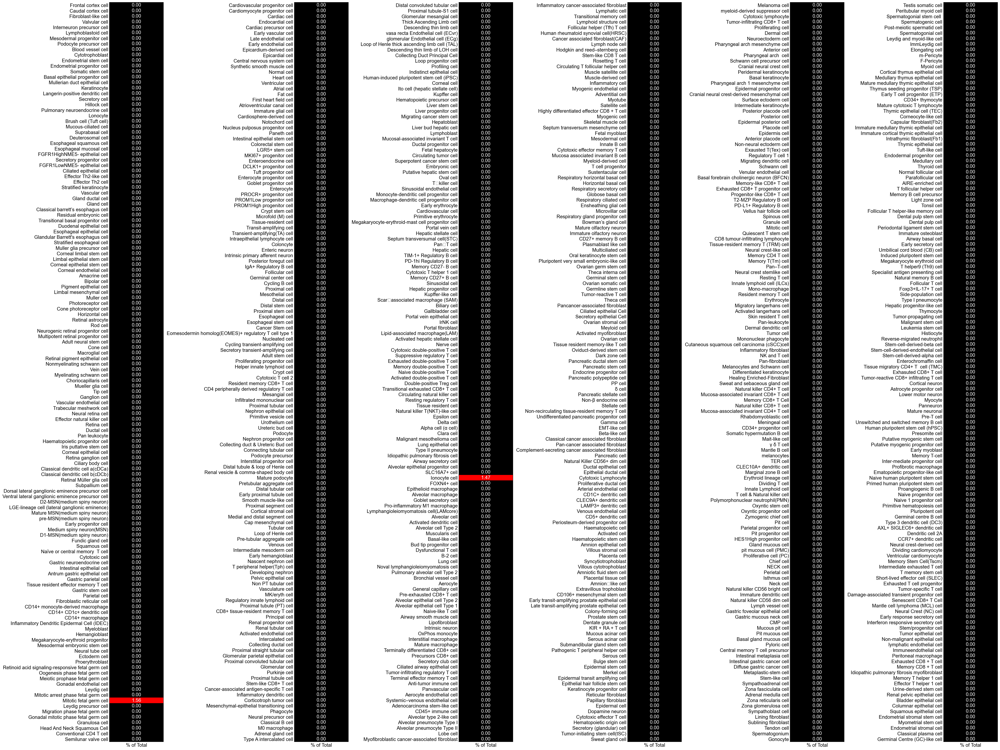

In [152]:
# Split the dataframe into part 2
half_df = percent_total_per_cell.tail(round(len(percent_total_per_cell)/2))
split_df = np.array_split(half_df, 6)

# create a figure with 6 subplots
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(40, 30), constrained_layout = True)

cmap = colors.ListedColormap(['black', 'red'])
# plot each dataframe as a heatmap in its corresponding subplot
for i, df_part in enumerate(split_df):
    ax = axes[i]
    ax.imshow(df_part, cmap=cmap, vmax=2,
              aspect='auto')
    ax.set_xticks(range(len(df_part.columns)))
    ax.set_yticks(range(len(df_part)))
    ax.set_xticklabels(df_part.columns)
    ax.set_yticklabels(df_part.index)
    ax.tick_params(axis='both', which='both', length=0)
    
    for j in range(df_part.shape[0]):
        for k in range(df_part.shape[1]):
            text = ax.text(k, j, f'{df_part.iloc[j,k]:.2f}',
                               ha="center", va="center", color="w")
    
# add padding between subplots
plt.tight_layout(pad=10.0)
plt.savefig('Tabula_Sapiens_255_analysis/Single_Cell_Markers_Hits_Part2.png')
plt.show()

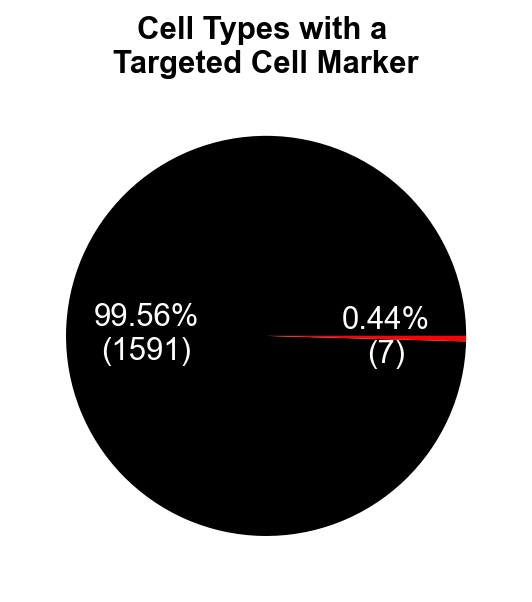

In [204]:
#pie plot showing the percent of total cells with a cell marker being hit
c_nonhit = len(cell_df[cell_df['hits']==0])
c_hit = len(cell_df[cell_df['hits']!=0])
y = [c_nonhit, c_hit]

fig, ax = plt.subplots(figsize = (4, 4))
explode = [ 0, 0.0]
colors = ["black", "red", ]
total=len(cell_df)
def my_fmt(x):
    return '{:.2f}%\n({:.0f})'.format(x, total*x/100)


plt.pie(y, explode = explode, colors=colors, autopct=my_fmt, pctdistance=0.6, textprops={'color':"w"})
plt.title('Cell Types with a \nTargeted Cell Marker',fontsize=14,fontweight="bold")
plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/Pie_Chart_Cells_with_targeted_cell_marker.png')
plt.show() 

Histogram was not useful in displaying the distribution, couldn't see the non-zero cell types

# Show the improvement in gene markers for the cell types with targeted genes 

Since there are three immune cells whose unique gene markers are being targeted

does scCLEAN globally enhance the genes associated to those cell types with a fixed threshold? 

need to have the proper cell cluster comparisons between the two groups - use this on new annotated data

subset to only the cell types shared between both groups, or else the statistical test will be slightly bias

In [4]:
#control
adata = sc.read_h5ad('Seurat_Annotated_Cell_Clusters/COntrol_Seurat_annotated.h5ad')
adata

AnnData object with n_obs × n_vars = 10195 × 21407
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'SCT_snn_res.0.05', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.4', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'seurat_clusters', 'percent_hb', 'doublets', 'SCT_snn_res.0.01', 'SCT_snn_res.0.6'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

categories: Memory CD4+ T, Naive CD4+ T, Classical Mono, etc.
var_group_labels: Naive CD4+ T, Classical Mono, Mature NK, etc.


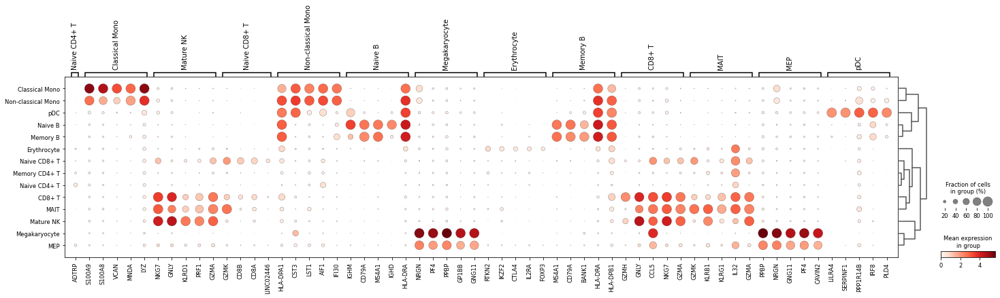

In [31]:
#marker genes
sc.tl.rank_genes_groups(adata, 'seurat_clusters', method='wilcoxon')
sc.tl.filter_rank_genes_groups(adata, min_fold_change=3)
sc.pl.rank_genes_groups_dotplot(adata, key='rank_genes_groups_filtered', n_genes=5)

In [34]:
#compare the number of markers for each group passing threshold
cell_types = list(adata.obs['seurat_clusters'].unique())
marker = []
for cell in cell_types:
    hits = np.array(adata.uns['rank_genes_groups_filtered']['names'][cell])
    hits = hits[~(pd.isna(hits))]
    marker.append(len(hits))

ctrl_markers = pd.DataFrame()
ctrl_markers['cells'] = cell_types
ctrl_markers['markers'] = marker
ctrl_markers = ctrl_markers.sort_values(by='markers', ascending=False)
ctrl_markers

,cells,markers
4,Classical Mono,376
13,pDC,288
5,Megakaryocyte,194
7,Non-classical Mono,104
9,Memory B,85
1,Mature NK,79
8,Naive B,78
6,MAIT,19
11,MEP,11
12,CD8+ T,11


In [36]:
#scCLEAN
data = sc.read_h5ad('Seurat_Annotated_Cell_Clusters/Depleted_rep3_Seurat_annotated.h5ad')
data

AnnData object with n_obs × n_vars = 10324 × 21441
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'S.Score', 'G2M.Score', 'Phase', 'SCT_snn_res.0.01', 'SCT_snn_res.0.05', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.4', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'SCT_snn_res.1.2', 'seurat_clusters', 'doublets', 'percent_hb', 'SCT_snn_res.0.6'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

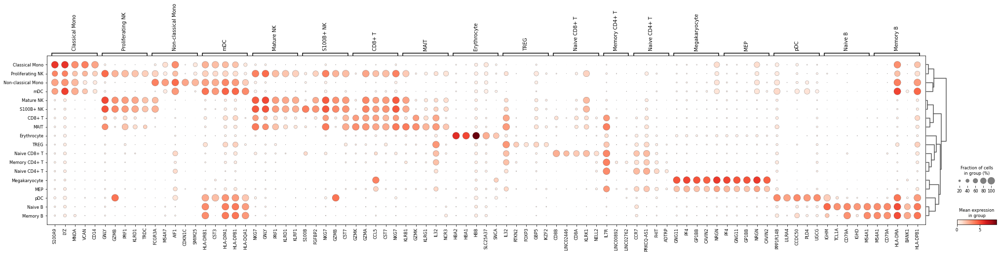

In [38]:
#marker genes
sc.tl.rank_genes_groups(data, 'seurat_clusters', method='wilcoxon')
sc.tl.filter_rank_genes_groups(data, min_fold_change=3)
sc.pl.rank_genes_groups_dotplot(data, key='rank_genes_groups_filtered', n_genes=5)

In [39]:
#compare the number of markers for each group passing threshold
cell_types = list(data.obs['seurat_clusters'].unique())
marker = []
for cell in cell_types:
    hits = np.array(data.uns['rank_genes_groups_filtered']['names'][cell])
    hits = hits[~(pd.isna(hits))]
    marker.append(len(hits))

sc_markers = pd.DataFrame()
sc_markers['cells'] = cell_types
sc_markers['markers'] = marker
sc_markers = sc_markers.sort_values(by='markers', ascending=False)
sc_markers

,cells,markers
4,Classical Mono,398
17,pDC,330
12,Megakaryocyte,203
15,Non-classical Mono,191
14,mDC,121
6,Memory B,107
9,Naive B,98
1,Mature NK,68
11,S100B+ NK,36
0,Erythrocyte,26


In [46]:
#combine the two dataframes to compare
merged = sc_markers.set_index('cells')
merged['scCLEAN'] = merged['markers']
ctrl_df = ctrl_markers.set_index('cells')
merged['Standard'] = ctrl_df['markers']
merged = merged.drop('markers', axis=1)
merged = merged.fillna(0)
merged

,scCLEAN,Standard
cells,,
Classical Mono,398,376.0
pDC,330,288.0
Megakaryocyte,203,194.0
Non-classical Mono,191,104.0
mDC,121,0.0
Memory B,107,85.0
Naive B,98,78.0
Mature NK,68,79.0
S100B+ NK,36,0.0


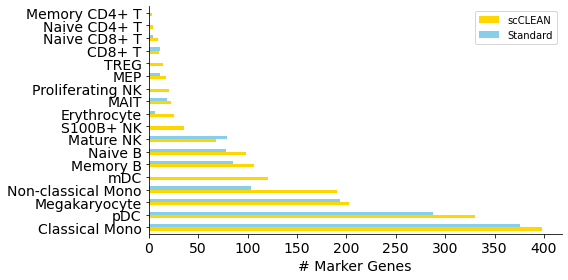

In [79]:
#plot the horizontal bar plot with 
cmap = colors.ListedColormap(['gold', 'skyblue'])
ax = merged.plot(kind="barh", figsize=(8,4), xlabel='', colormap=cmap, fontsize=14)

right_side = ax.spines["right"]
right_side.set_visible(False)
top = ax.spines["top"]
top.set_visible(False)

plt.xlabel('# Marker Genes', fontsize=14)
plt.tight_layout()
#plt.savefig('Tabula_Sapiens_255_analysis/Cell_Type_Markers.png')
plt.show()

# TPM graphs from GTEX

The amount of reads TPMs being absorbed by the 255 genes being targeted

by tissue type and by cell type

GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct.gz

https://gtexportal.org/home/datasets 

In [91]:
#import the gtex data
gtex = pd.read_csv('Tabula_Sapiens_255_analysis/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct', sep='\t',skiprows=2)
gtex = gtex.set_index('Description')
#subset to only the 255 targeted genes
gtex_sub = gtex[gtex.index.isin(scclean_genes)]
gtex_sub = gtex_sub.drop('Name', axis=1)
gtex_sub.loc["Total"] = gtex_sub.sum()
gtex_sub = gtex_sub.T
gtex_sub = gtex_sub.sort_values(by='Total', ascending=False)
gtex_sub['Tissue'] = gtex_sub.index


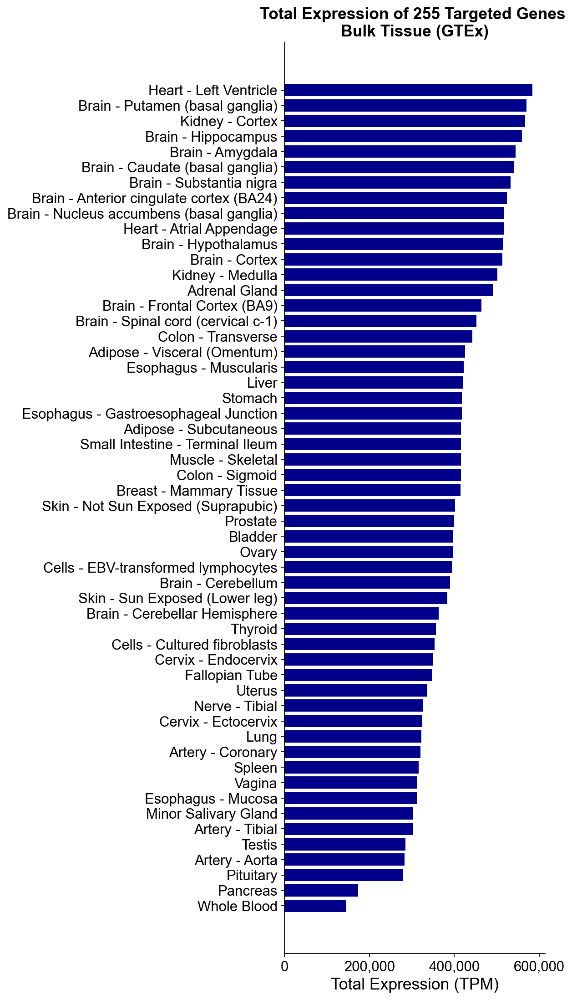

In [95]:
#plot the cumulative expression within tissues
import matplotlib as mpl
fig, ax = plt.subplots(figsize=(8,14))
x = gtex_sub['Tissue']
y = gtex_sub['Total']

ax.barh(x, y, align='center', color='darkblue')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Total Expression (TPM)', fontsize=16,)
ax.set_title('Total Expression of 255 Targeted Genes \nBulk Tissue (GTEx)', fontsize=16, fontweight='bold')
ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

right_side = ax.spines["right"]
right_side.set_visible(False)
top = ax.spines["top"]
top.set_visible(False)

plt.tight_layout()
plt.savefig('Tabula_Sapiens_255_analysis/GTEX_Bulk_255_gene_expression.png')
plt.show()

# Enrichment - Panglao + Tao scores + Individual Variance

https://genomics.senescence.info/gene_expression/tau.html

Tao score = tissue specifcity (GTEX v8)

Tao_score.zip

Genes with a tau index close to 1 are more specifically expressed in one tissue

Genes with a tau index closer to 0 are equally expressed across all tissues studied

Test to see where these 255 genes fall on the tao index, should be on the half 

In [127]:
#import the gene to ensembl ID conversion table
conv = pd.read_csv('Tabula_Sapiens_255_analysis/Gene_name_ensembl_ID_conversion.csv')
conv = conv.set_index('gene_id')

#read in the tau score
tau = pd.read_csv('Tabula_Sapiens_255_analysis/Tau_score/Tau_gene_V8.csv').dropna()
tau = tau[['gene_id', 'tau']]
tau = tau.set_index('gene_id')
tau['gene'] = conv['feature_name']
tau = tau.set_index('gene')
tau = tau.sort_values(by='tau', ascending=False)


#genes for the enrichment plot
scclean_genes = NVG+MT+Ribo

#make the custom gene set
gene_sets={'Enrichment - 255 Targeted Genes - Tau Score (GTEx)':scclean_genes}

In [143]:
pre_res = gp.prerank(rnk=tau,
                     gene_sets=gene_sets, 
                     threads=4,
                     min_size=5,
                     max_size=10000,
                     permutation_num=1000, 
                     permutation_type='gene_set',
                     outdir=None,  
                     seed=6, 
                     verbose=True, # see what's going on behind the scenes
                    )

2023-03-10 14:53:22,975 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!
2023-03-10 14:53:23,014 [WARNING] Duplicated values found in preranked stats: 20.72% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2023-03-10 14:53:23,016 [INFO] Parsing data files for GSEA.............................
2023-03-10 14:53:23,023 [INFO] 0000 gene_sets have been filtered out when max_size=10000 and min_size=5
2023-03-10 14:53:23,024 [INFO] 0001 gene_sets used for further statistical testing.....
2023-03-10 14:53:23,025 [INFO] Start to run GSEA...Might take a while..................
2023-03-10 14:53:24,901 [INFO] Congratulations. GSEApy runs successfully................



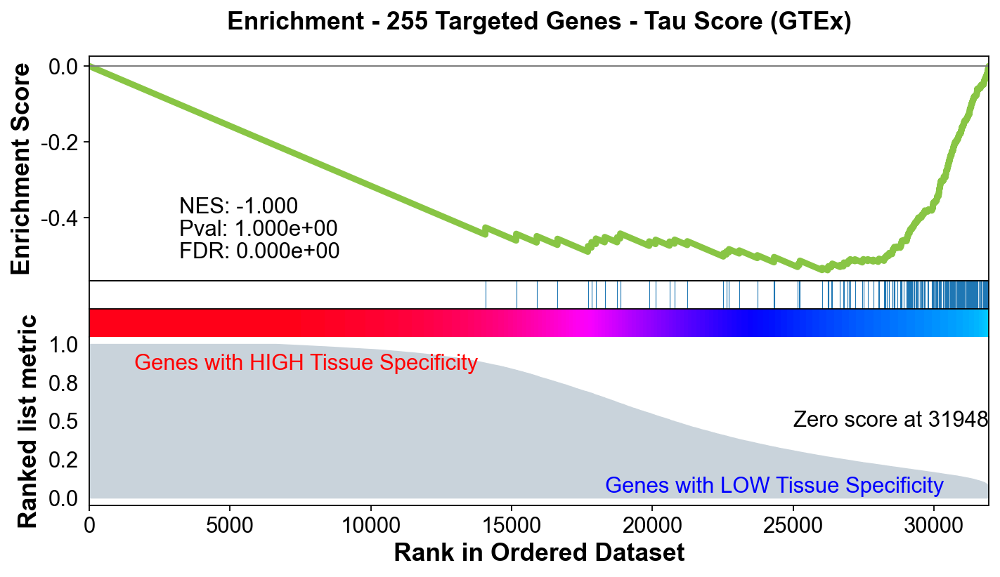

In [147]:
#generate the enrichment plot
terms = pre_res.res2d.Term
i = 0
# to save your figure, make sure that ofname is not None, ofname: output file name
plt.rcParams['axes.grid'] = False
fig = gseaplot(rank_metric=pre_res.ranking, 
         term=terms[i], 
         **pre_res.results[terms[i]],
        pheno_pos='Genes with HIGH Biological Variation', 
        pheno_neg='Genes with LOW Biological Variation',
        cmap="hsv",
        figsize=(10,5),
        ofname='Tabula_Sapiens_255_analysis/GTEX_Tau_Enrichment.png')

fig = gseaplot(rank_metric=pre_res.ranking, 
         term=terms[i], 
         **pre_res.results[terms[i]],
        pheno_pos='Genes with HIGH Tissue Specificity', 
        pheno_neg='Genes with LOW Tissue Specificity',
        cmap="hsv",
        figsize=(10,5))

#positive NES indicates enriched at the top of the list 
#negative NES indicates enriched at the bottom of the list

Panglao DB

gives a ubiquitonous index for all of the human genes, the more ubiquitous (1), the more likely to be house keeping,

Test to see where these 255 genes fall along the index, should be on the upper half 

https://panglaodb.se/ui.html

Panglao_Ubiquity_Index.csv

In [180]:
#read in the panglao ubiquity index
png = pd.read_csv('Tabula_Sapiens_255_analysis/Panglao_Ubiquity_Index.csv')
png = png.set_index('gene')
png = png.sort_values(by='ubiquity', ascending=False)

#make the custom gene set
gene_sets={'Enrichment - 255 Targeted Genes - Panglao Ubiquity Index':scclean_genes}

In [181]:
pre_res = gp.prerank(rnk=png,
                     gene_sets=gene_sets, 
                     threads=4,
                     min_size=5,
                     max_size=10000,
                     permutation_num=1000, 
                     permutation_type='gene_set',
                     outdir=None,  
                     seed=6, 
                     verbose=True, # see what's going on behind the scenes
                    )

2023-03-10 16:16:34,179 [WARNING] Input gene rankings contains duplicated IDs, Only use the duplicated ID with highest value!
2023-03-10 16:16:34,194 [WARNING] Duplicated values found in preranked stats: 99.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2023-03-10 16:16:34,196 [INFO] Parsing data files for GSEA.............................
2023-03-10 16:16:34,200 [INFO] 0000 gene_sets have been filtered out when max_size=10000 and min_size=5
2023-03-10 16:16:34,201 [INFO] 0001 gene_sets used for further statistical testing.....
2023-03-10 16:16:34,201 [INFO] Start to run GSEA...Might take a while..................
2023-03-10 16:16:35,415 [INFO] Congratulations. GSEApy runs successfully................



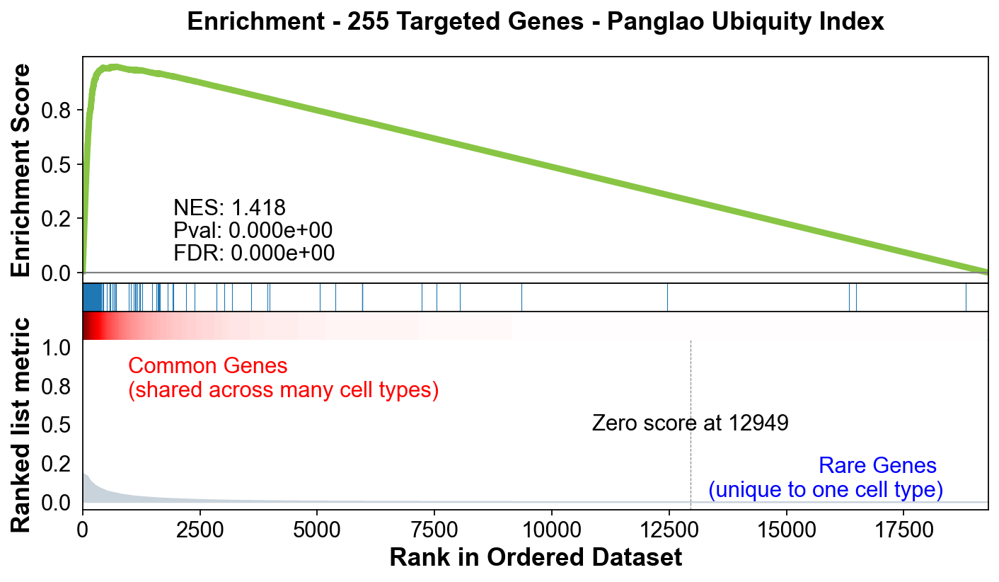

In [185]:
#generate the enrichment plot
terms = pre_res.res2d.Term
i = 0
# to save your figure, make sure that ofname is not None, ofname: output file name
plt.rcParams['axes.grid'] = False
fig = gseaplot(rank_metric=pre_res.ranking, 
         term=terms[i], 
         **pre_res.results[terms[i]],
        pheno_pos='Common Genes (shared across many cell types)', 
        pheno_neg='Rare Genes (unique to one cell type)',
        cmap="seismic",
        figsize=(10,5),
        ofname='Tabula_Sapiens_255_analysis/Panglao_Ubiquity_Enrichment.png')

fig = gseaplot(rank_metric=pre_res.ranking, 
         term=terms[i], 
         **pre_res.results[terms[i]],
        pheno_pos='Common Genes \n(shared across many cell types)', 
        pheno_neg='Rare Genes \n(unique to one cell type)',
        cmap="seismic",
        figsize=(10,5))

#positive NES indicates enriched at the top of the list 
#negative NES indicates enriched at the bottom of the list